In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
from collections import Counter
import spacy
import torch
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.models as models
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T
from PIL import Image

In [2]:
data_location =  "../input/flickr8k"

In [3]:
caption_file = data_location + '/captions.txt'
df = pd.read_csv(caption_file)
print("There are {} image to captions".format(len(df)))
df.head(7)

There are 40455 image to captions


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...


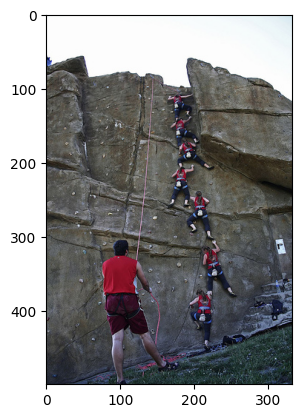

Caption: Several climbers in a row are climbing the rock while the man in red watches and holds the line .
Caption: A brown dog chases the water from a sprinkler on a lawn .
Caption: a brown dog plays with the hose .
Caption: A brown dog running on a lawn near a garden hose
Caption: A dog is playing with a hose .


In [4]:
data_idx = 64
image_path = data_location+"/Images/"+df.iloc[data_idx,0]
img=mpimg.imread(image_path)
plt.imshow(img)
plt.show()
for i in range(data_idx,data_idx+5):
    print("Caption:",df.iloc[i,1])

In [5]:
spacy_eng = spacy.load("en_core_web_sm")
text = "This is a nice mountain to climb"
[token.text.lower() for token in spacy_eng.tokenizer(text)]

['this', 'is', 'a', 'nice', 'mountain', 'to', 'climb']

In [6]:
class Vocabulary:
    def __init__(self,freq_threshold):
        self.itos = {0:"<PAD>",1:"<SOS>",2:"<EOS>",3:"<UNK>"}
        self.stoi = {v:k for k,v in self.itos.items()}
        self.freq_threshold = freq_threshold
        
    def __len__(self): return len(self.itos)

    @staticmethod
    def tokenize(text):
        return [token.text.lower() for token in spacy_eng.tokenizer(text)]
    
    def build_vocab(self, sentence_list):
        frequencies = Counter()
        idx = 4
        for sentence in sentence_list:
            for word in self.tokenize(sentence):
                frequencies[word] += 1
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1
    
    def numericalize(self,text):
        tokenized_text = self.tokenize(text)
        return [ self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_text ]  

In [7]:
v = Vocabulary(freq_threshold=1)
v.build_vocab(["This is a good place to find a city"])
print(v.stoi)
print(v.numericalize("This is a good place to find a city here!!"))

{'<PAD>': 0, '<SOS>': 1, '<EOS>': 2, '<UNK>': 3, 'this': 4, 'is': 5, 'a': 6, 'good': 7, 'place': 8, 'to': 9, 'find': 10, 'city': 11}
[4, 5, 6, 7, 8, 9, 10, 6, 11, 3, 3, 3]


In [8]:
class FlickrDataset(Dataset):
    def __init__(self,root_dir,captions_file,transform=None,freq_threshold=5):
        self.root_dir = root_dir
        self.df = pd.read_csv(caption_file)
        self.transform = transform

        self.imgs = self.df["image"]
        self.captions = self.df["caption"]
        
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocab(self.captions.tolist())
        
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self,idx):
        caption = self.captions[idx]
        img_name = self.imgs[idx]
        img_location = os.path.join(self.root_dir,img_name)
        img = Image.open(img_location).convert("RGB")
        if self.transform is not None:
            img = self.transform(img)
        caption_vec = []
        caption_vec += [self.vocab.stoi["<SOS>"]]
        caption_vec += self.vocab.numericalize(caption)
        caption_vec += [self.vocab.stoi["<EOS>"]]
        
        return img, torch.tensor(caption_vec)

In [9]:
def show_image(img, title=None):
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224 
    img[2] = img[2] * 0.225 
    img[0] += 0.485 
    img[1] += 0.456 
    img[2] += 0.406
    img = img.numpy().transpose((1, 2, 0))
    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  #plot updating

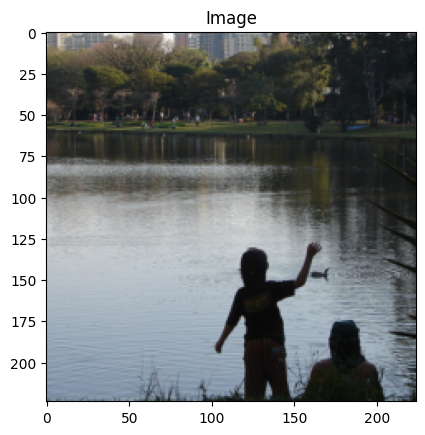

Token: tensor([  1,   4,  28,  16,   4,  80,  34,  19, 766, 163,   8,   4, 250, 215,
          5,   2])
Sentence:
['<SOS>', 'a', 'child', 'and', 'a', 'woman', 'are', 'at', 'waters', 'edge', 'in', 'a', 'big', 'city', '.', '<EOS>']


In [10]:
transforms = T.Compose([
    T.Resize(226),                     
    T.RandomCrop(224),                 
    T.ToTensor(),                               
    T.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))
])

dataset =  FlickrDataset(
    root_dir = data_location+"/Images",
    captions_file = data_location+"/captions.txt",
    transform=transforms
)

img, caps = dataset[80]
show_image(img,"Image")
print("Token:",caps)
print("Sentence:")
print([dataset.vocab.itos[token] for token in caps.tolist()])

In [11]:
class CapsCollate:
    def __init__(self,pad_idx,batch_first=False):
        self.pad_idx = pad_idx
        self.batch_first = batch_first
    
    def __call__(self,batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs,dim=0)
        
        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=self.batch_first, padding_value=self.pad_idx)
        return imgs,targets

In [12]:
BATCH_SIZE = 4
NUM_WORKER = 1
pad_idx = dataset.vocab.stoi["<PAD>"]

data_loader = DataLoader(
    dataset=dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
)

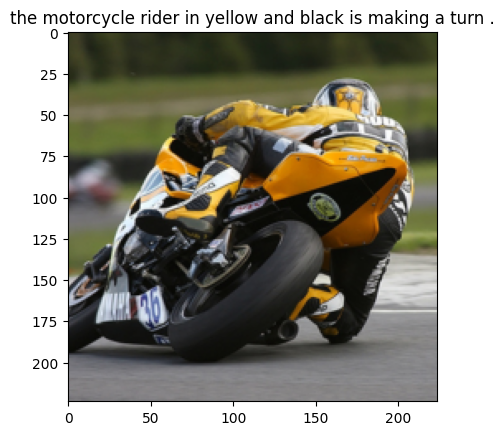

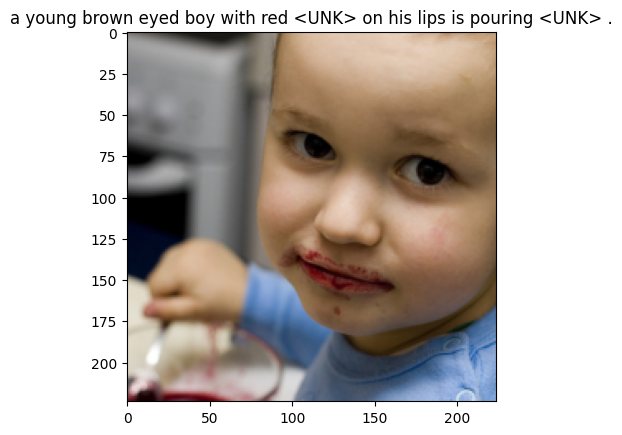

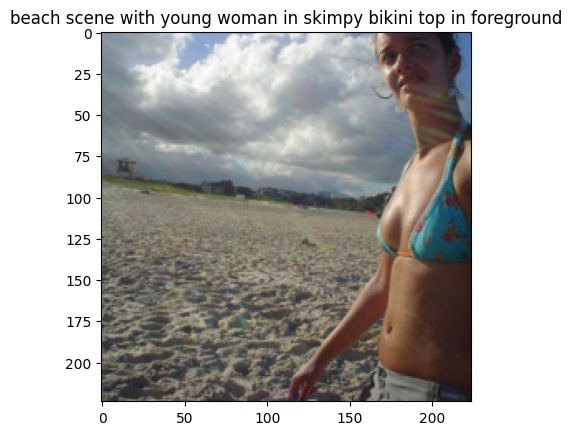

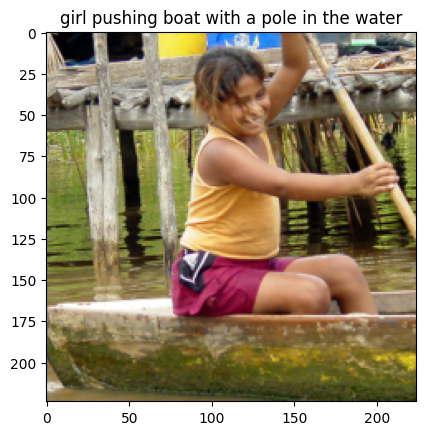

In [13]:
dataiter = iter(data_loader)
batch = next(dataiter)
images, captions = batch

for i in range(BATCH_SIZE):
    img,cap = images[i],captions[i]
    caption_label = [dataset.vocab.itos[token] for token in cap.tolist()]
    eos_index = caption_label.index('<EOS>')
    caption_label = caption_label[1:eos_index]
    caption_label = ' '.join(caption_label)                      
    show_image(img,caption_label)
    plt.show()

In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [15]:
class EncoderCNN(nn.Module):
    def __init__(self):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(pretrained=True)
        for param in resnet.parameters():
            param.requires_grad_(False)
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)

    def forward(self, images):
        features = self.resnet(images)
        features = features.permute(0, 2, 3, 1)
        features = features.view(features.size(0), -1, features.size(-1))
        return features

In [16]:
class Attention(nn.Module):
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super(Attention, self).__init__()
        self.attention_dim = attention_dim
        self.W = nn.Linear(decoder_dim,attention_dim)
        self.U = nn.Linear(encoder_dim,attention_dim)
        self.A = nn.Linear(attention_dim,1)
        
    def forward(self, features, hidden_state):
        u_hs = self.U(features)
        w_ah = self.W(hidden_state)
        combined_states = torch.tanh(u_hs + w_ah.unsqueeze(1))
        attention_scores = self.A(combined_states)
        attention_scores = attention_scores.squeeze(2)
        alpha = F.softmax(attention_scores,dim=1)
        attention_weights = features * alpha.unsqueeze(2)
        attention_weights = attention_weights.sum(dim=1)
        return alpha,attention_weights

In [17]:
# Attention Decoder module to generate captions
class DecoderRNN(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        
        #save the model param
        self.vocab_size = vocab_size
        self.attention_dim = attention_dim
        self.decoder_dim = decoder_dim
        
        # generate embeddings for words
        self.embedding = nn.Embedding(vocab_size,embed_size)
        self.attention = Attention(encoder_dim,decoder_dim,attention_dim)
        
        # features representation
        self.init_h = nn.Linear(encoder_dim, decoder_dim)  
        self.init_c = nn.Linear(encoder_dim, decoder_dim)  
        self.lstm_cell = nn.LSTMCell(embed_size+encoder_dim,decoder_dim,bias=True)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        
        # linear layer that outputs one-hot vector of predicted word
        self.fcn = nn.Linear(decoder_dim,vocab_size)
        self.drop = nn.Dropout(drop_prob)
        
    # inputs are feature representation and captions (vectors)    
    def forward(self, features, captions):
        
        #vectorize the caption
        embeds = self.embedding(captions)
        
        # Initialize LSTM state
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)
        
        #get the seq length to iterate
        seq_length = len(captions[0])-1 #Exclude the last one
        batch_size = captions.size(0)
        num_features = features.size(1)
        
        # predicted captions in form of one-hot vectors
        preds = torch.zeros(batch_size, seq_length, self.vocab_size).to(device)
        alphas = torch.zeros(batch_size, seq_length,num_features).to(device)
        
        # feed in the input for each time instance along with context vectors
        for s in range(seq_length):
            # first, pass the features and decoder hidden state
            alpha,context = self.attention(features, h)
            
            # lstm input are embeddings repr words and context vectors
            lstm_input = torch.cat((embeds[:, s], context), dim=1)
            
            # hidden state for next time instance
            h, c = self.lstm_cell(lstm_input, (h, c))
            
            # pass through dropout layer
            output = self.fcn(self.drop(h))
            
            # get the prediction and weights
            preds[:,s] = output
            alphas[:,s] = alpha  
        
        return preds, alphas
    
    def generate_caption(self,features,max_len=50,vocab=None):
        batch_size = features.size(0)
        h, c = self.init_hidden_state(features)
        alphas = []
        word = torch.tensor(vocab.stoi['<SOS>']).view(1,-1).to(device)
        embeds = self.embedding(word)
        captions = []
        
        for i in range(max_len):
            alpha,context = self.attention(features, h)
            alphas.append(alpha.cpu().detach().numpy())
            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
            output = self.fcn(self.drop(h))
            output = output.view(batch_size,-1)
            predicted_word_idx = output.argmax(dim=1)
            captions.append(predicted_word_idx.item())
            
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break
            embeds = self.embedding(predicted_word_idx.unsqueeze(0))
        return [vocab.itos[idx] for idx in captions],alphas

    def init_hidden_state(self, encoder_out):
        batch_size = encoder_out.size(0)
        h = torch.zeros(batch_size, self.decoder_dim).to(encoder_out.device)
        c = torch.zeros(batch_size, self.decoder_dim).to(encoder_out.device)
        return h, c

In [18]:
class EncoderDecoder(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        # No params for encoder, uses resnet
        self.encoder = EncoderCNN()
        # Tune decoder params here
        self.decoder = DecoderRNN(
            embed_size=embed_size,
            vocab_size = len(dataset.vocab),
            attention_dim=attention_dim,
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim
        )
    
    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs

In [19]:
#Hyperparams
embed_size=500
vocab_size = len(dataset.vocab)
attention_dim=256
encoder_dim=2048
decoder_dim=512
learning_rate = 3e-4

In [20]:
model = EncoderDecoder(
    embed_size=500,
    vocab_size = len(dataset.vocab),
    attention_dim=256,
    encoder_dim=2048,
    decoder_dim=512
).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 153MB/s] 


In [21]:
def save_model(model,num_epochs):
    model_state = {
        'num_epochs':num_epochs,
        'embed_size':embed_size,
        'vocab_size':len(dataset.vocab),
        'attention_dim':attention_dim,
        'encoder_dim':encoder_dim,
        'decoder_dim':decoder_dim,
        'state_dict':model.state_dict()
    }

    torch.save(model_state,'/kaggle/working/attention_model_state_'+str(num_epochs)+'.pth')

Beginning epoch number: 1
Epoch: 1 Batch: 1000 loss: 4.41663
Epoch: 1 Batch: 2000 loss: 3.13843
Epoch: 1 Batch: 3000 loss: 3.10484
Epoch: 1 Batch: 4000 loss: 3.67851
Epoch: 1 Batch: 5000 loss: 3.79389
Epoch: 1 Batch: 6000 loss: 2.86257
Epoch: 1 Batch: 7000 loss: 2.68453
Epoch: 1 Batch: 8000 loss: 3.13789
Epoch: 1 Batch: 9000 loss: 2.62104
Epoch: 1 Batch: 10000 loss: 3.38677


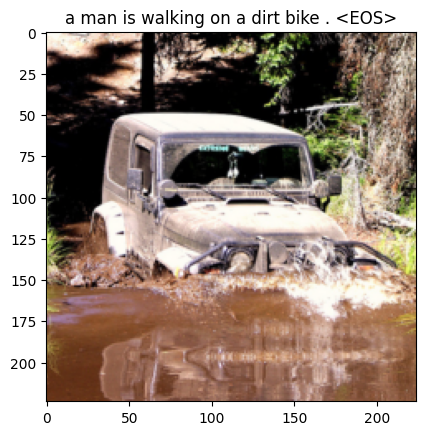

Ending epoch number: 1
Beginning epoch number: 2
Epoch: 2 Batch: 1000 loss: 2.49130
Epoch: 2 Batch: 2000 loss: 3.08061
Epoch: 2 Batch: 3000 loss: 2.23221
Epoch: 2 Batch: 4000 loss: 2.16944
Epoch: 2 Batch: 5000 loss: 2.80921
Epoch: 2 Batch: 6000 loss: 3.04701
Epoch: 2 Batch: 7000 loss: 2.14315
Epoch: 2 Batch: 8000 loss: 4.17156
Epoch: 2 Batch: 9000 loss: 2.19065
Epoch: 2 Batch: 10000 loss: 3.10802


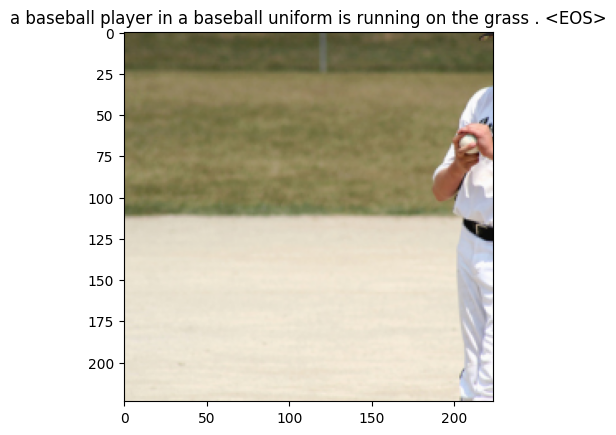

Ending epoch number: 2
Beginning epoch number: 3
Epoch: 3 Batch: 1000 loss: 2.83241
Epoch: 3 Batch: 2000 loss: 2.82953
Epoch: 3 Batch: 3000 loss: 3.27561
Epoch: 3 Batch: 4000 loss: 3.24381
Epoch: 3 Batch: 5000 loss: 2.44657
Epoch: 3 Batch: 6000 loss: 2.65089
Epoch: 3 Batch: 7000 loss: 1.96048
Epoch: 3 Batch: 8000 loss: 2.82108
Epoch: 3 Batch: 9000 loss: 2.91142
Epoch: 3 Batch: 10000 loss: 3.02911


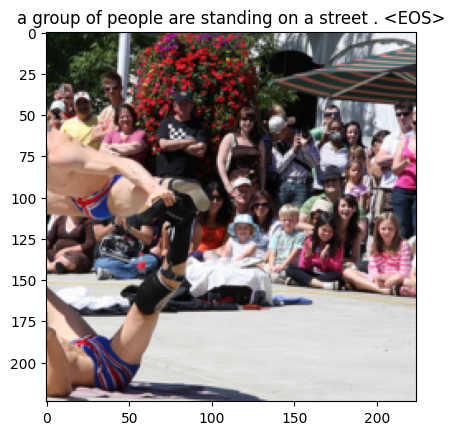

Ending epoch number: 3
Beginning epoch number: 4
Epoch: 4 Batch: 1000 loss: 2.18331
Epoch: 4 Batch: 2000 loss: 3.35627
Epoch: 4 Batch: 3000 loss: 3.32118
Epoch: 4 Batch: 4000 loss: 2.48792
Epoch: 4 Batch: 5000 loss: 2.94324
Epoch: 4 Batch: 6000 loss: 2.34212
Epoch: 4 Batch: 7000 loss: 2.48173
Epoch: 4 Batch: 8000 loss: 3.10600
Epoch: 4 Batch: 9000 loss: 2.46927
Epoch: 4 Batch: 10000 loss: 2.45264


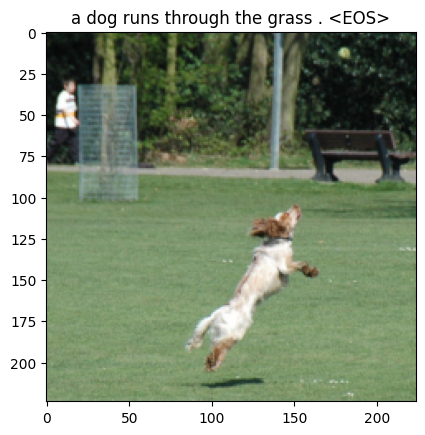

Ending epoch number: 4
Beginning epoch number: 5
Epoch: 5 Batch: 1000 loss: 2.73154
Epoch: 5 Batch: 2000 loss: 2.79878
Epoch: 5 Batch: 3000 loss: 2.08424
Epoch: 5 Batch: 4000 loss: 2.26693
Epoch: 5 Batch: 5000 loss: 2.19895
Epoch: 5 Batch: 6000 loss: 2.39677
Epoch: 5 Batch: 7000 loss: 2.86989
Epoch: 5 Batch: 8000 loss: 2.24324
Epoch: 5 Batch: 9000 loss: 2.05716
Epoch: 5 Batch: 10000 loss: 2.80240


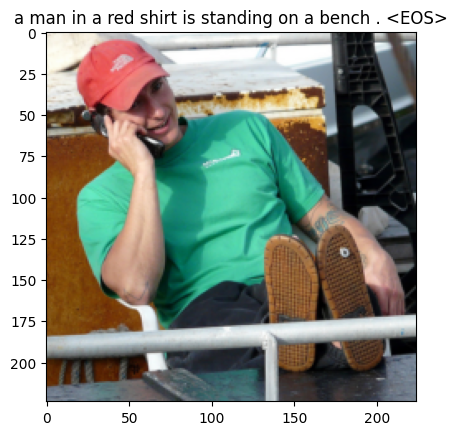

Ending epoch number: 5
Beginning epoch number: 6
Epoch: 6 Batch: 1000 loss: 2.23644
Epoch: 6 Batch: 2000 loss: 2.09671
Epoch: 6 Batch: 3000 loss: 2.23428
Epoch: 6 Batch: 4000 loss: 3.26317
Epoch: 6 Batch: 5000 loss: 2.28642
Epoch: 6 Batch: 6000 loss: 2.36118
Epoch: 6 Batch: 7000 loss: 2.71869
Epoch: 6 Batch: 8000 loss: 2.54820
Epoch: 6 Batch: 9000 loss: 2.62301
Epoch: 6 Batch: 10000 loss: 2.80286


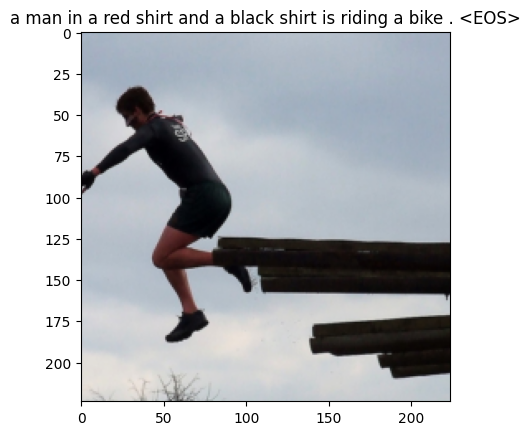

Ending epoch number: 6
Beginning epoch number: 7
Epoch: 7 Batch: 1000 loss: 3.13425
Epoch: 7 Batch: 2000 loss: 2.57711
Epoch: 7 Batch: 3000 loss: 2.09858
Epoch: 7 Batch: 4000 loss: 2.12249
Epoch: 7 Batch: 5000 loss: 2.71281
Epoch: 7 Batch: 6000 loss: 2.13987
Epoch: 7 Batch: 7000 loss: 2.89894
Epoch: 7 Batch: 8000 loss: 2.38220
Epoch: 7 Batch: 9000 loss: 1.93843
Epoch: 7 Batch: 10000 loss: 2.80831


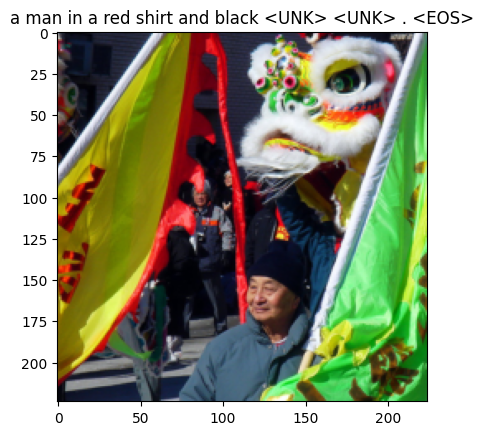

Ending epoch number: 7
Beginning epoch number: 8
Epoch: 8 Batch: 1000 loss: 1.87373
Epoch: 8 Batch: 2000 loss: 2.03834
Epoch: 8 Batch: 3000 loss: 1.98983
Epoch: 8 Batch: 4000 loss: 2.44445
Epoch: 8 Batch: 5000 loss: 2.21640
Epoch: 8 Batch: 6000 loss: 2.17400
Epoch: 8 Batch: 7000 loss: 2.44853
Epoch: 8 Batch: 8000 loss: 1.78788
Epoch: 8 Batch: 9000 loss: 2.75789
Epoch: 8 Batch: 10000 loss: 2.93530


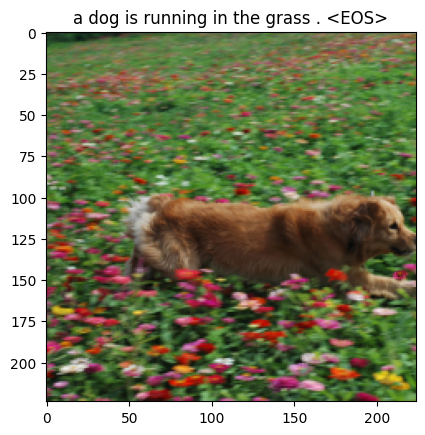

Ending epoch number: 8
Beginning epoch number: 9
Epoch: 9 Batch: 1000 loss: 2.42931
Epoch: 9 Batch: 2000 loss: 2.99790
Epoch: 9 Batch: 3000 loss: 2.28082
Epoch: 9 Batch: 4000 loss: 2.48181
Epoch: 9 Batch: 5000 loss: 2.50536
Epoch: 9 Batch: 6000 loss: 2.62292
Epoch: 9 Batch: 7000 loss: 1.79858
Epoch: 9 Batch: 8000 loss: 2.54204
Epoch: 9 Batch: 9000 loss: 2.19982
Epoch: 9 Batch: 10000 loss: 2.09853


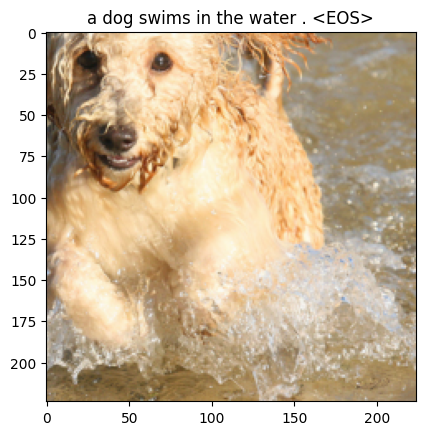

Ending epoch number: 9
Beginning epoch number: 10
Epoch: 10 Batch: 1000 loss: 2.25354
Epoch: 10 Batch: 2000 loss: 2.77360
Epoch: 10 Batch: 3000 loss: 2.81767
Epoch: 10 Batch: 4000 loss: 1.93506
Epoch: 10 Batch: 5000 loss: 2.27338
Epoch: 10 Batch: 6000 loss: 2.23954
Epoch: 10 Batch: 7000 loss: 3.34341
Epoch: 10 Batch: 8000 loss: 3.13665
Epoch: 10 Batch: 9000 loss: 2.13140
Epoch: 10 Batch: 10000 loss: 2.01120


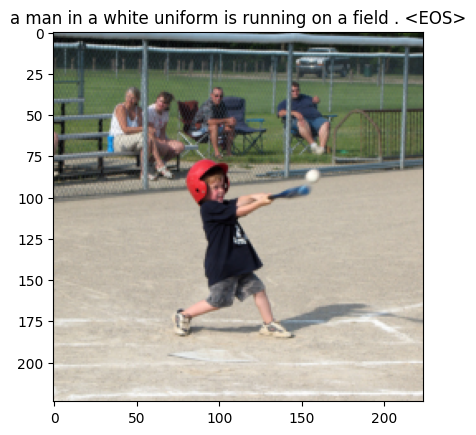

Ending epoch number: 10
Beginning epoch number: 11
Epoch: 11 Batch: 1000 loss: 2.52162
Epoch: 11 Batch: 2000 loss: 2.25060
Epoch: 11 Batch: 3000 loss: 2.16391
Epoch: 11 Batch: 4000 loss: 2.07598
Epoch: 11 Batch: 5000 loss: 2.78443
Epoch: 11 Batch: 6000 loss: 2.87387
Epoch: 11 Batch: 7000 loss: 2.54641
Epoch: 11 Batch: 8000 loss: 2.78625
Epoch: 11 Batch: 9000 loss: 2.76285
Epoch: 11 Batch: 10000 loss: 2.07367


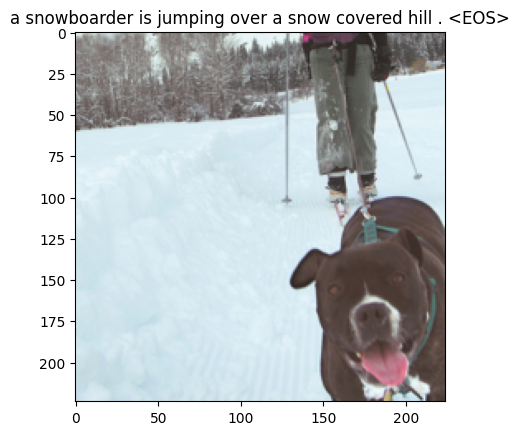

Ending epoch number: 11
Beginning epoch number: 12
Epoch: 12 Batch: 1000 loss: 2.63075
Epoch: 12 Batch: 2000 loss: 2.75412
Epoch: 12 Batch: 3000 loss: 2.10434
Epoch: 12 Batch: 4000 loss: 2.02443
Epoch: 12 Batch: 5000 loss: 2.32136
Epoch: 12 Batch: 6000 loss: 2.32572
Epoch: 12 Batch: 7000 loss: 2.84083
Epoch: 12 Batch: 8000 loss: 2.07011
Epoch: 12 Batch: 9000 loss: 2.24117
Epoch: 12 Batch: 10000 loss: 2.37032


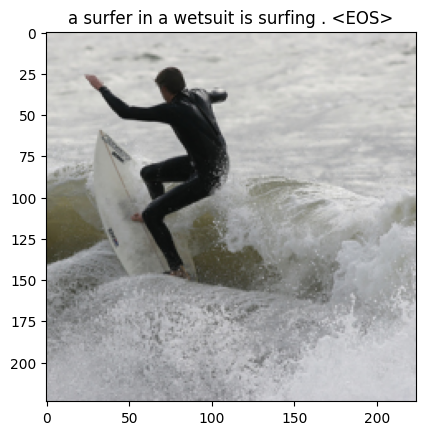

Ending epoch number: 12
Beginning epoch number: 13
Epoch: 13 Batch: 1000 loss: 2.04252
Epoch: 13 Batch: 2000 loss: 2.14450
Epoch: 13 Batch: 3000 loss: 2.68536
Epoch: 13 Batch: 4000 loss: 2.35060
Epoch: 13 Batch: 5000 loss: 2.13770
Epoch: 13 Batch: 6000 loss: 2.29091
Epoch: 13 Batch: 7000 loss: 2.61821
Epoch: 13 Batch: 8000 loss: 1.74768
Epoch: 13 Batch: 9000 loss: 2.01453
Epoch: 13 Batch: 10000 loss: 2.43510


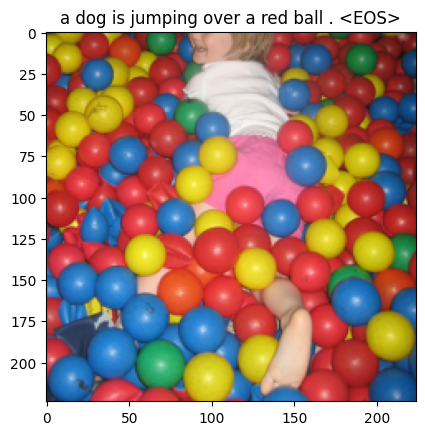

Ending epoch number: 13
Beginning epoch number: 14
Epoch: 14 Batch: 1000 loss: 1.90357
Epoch: 14 Batch: 2000 loss: 2.14414
Epoch: 14 Batch: 3000 loss: 2.77143
Epoch: 14 Batch: 4000 loss: 2.25866
Epoch: 14 Batch: 5000 loss: 2.08000
Epoch: 14 Batch: 6000 loss: 2.40033
Epoch: 14 Batch: 7000 loss: 2.10985
Epoch: 14 Batch: 8000 loss: 2.37655
Epoch: 14 Batch: 9000 loss: 1.49529
Epoch: 14 Batch: 10000 loss: 2.18735


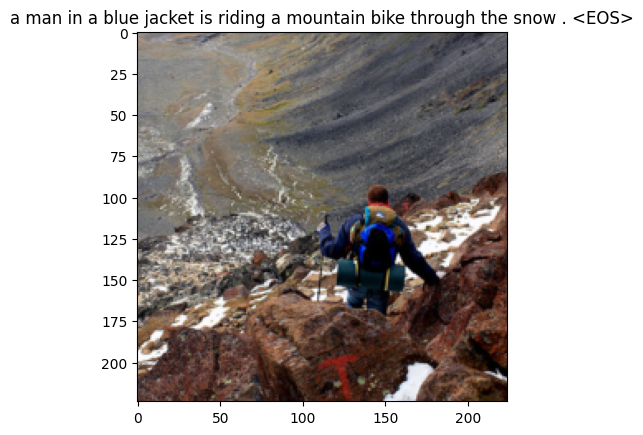

Ending epoch number: 14
Beginning epoch number: 15
Epoch: 15 Batch: 1000 loss: 1.99448
Epoch: 15 Batch: 2000 loss: 2.01678
Epoch: 15 Batch: 3000 loss: 1.76108
Epoch: 15 Batch: 4000 loss: 2.16274
Epoch: 15 Batch: 5000 loss: 1.89874
Epoch: 15 Batch: 6000 loss: 2.70885
Epoch: 15 Batch: 7000 loss: 1.83962
Epoch: 15 Batch: 8000 loss: 1.94377
Epoch: 15 Batch: 9000 loss: 2.05156
Epoch: 15 Batch: 10000 loss: 2.32553


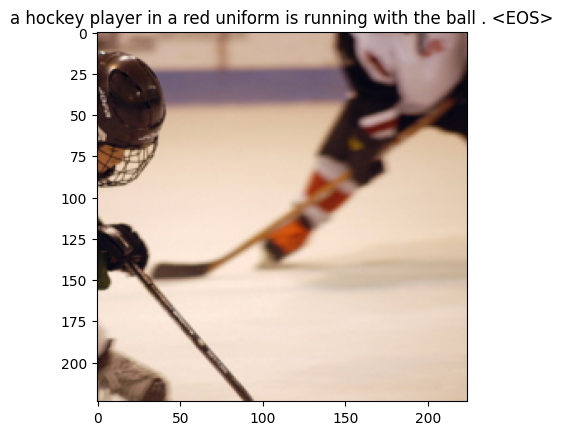

Ending epoch number: 15
Beginning epoch number: 16
Epoch: 16 Batch: 1000 loss: 1.80967
Epoch: 16 Batch: 2000 loss: 1.46098
Epoch: 16 Batch: 3000 loss: 1.80688
Epoch: 16 Batch: 4000 loss: 1.68908
Epoch: 16 Batch: 5000 loss: 1.91045
Epoch: 16 Batch: 6000 loss: 1.73668
Epoch: 16 Batch: 7000 loss: 2.49168
Epoch: 16 Batch: 8000 loss: 2.24352
Epoch: 16 Batch: 9000 loss: 2.28580
Epoch: 16 Batch: 10000 loss: 2.10184


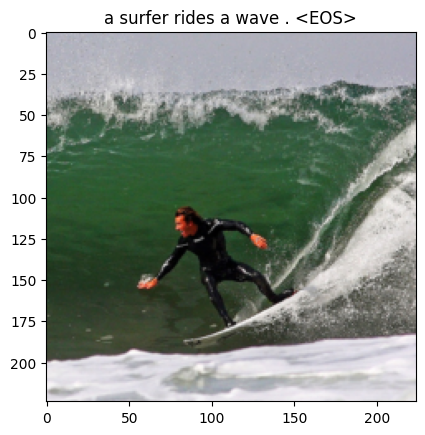

Ending epoch number: 16
Beginning epoch number: 17
Epoch: 17 Batch: 1000 loss: 2.32767
Epoch: 17 Batch: 2000 loss: 2.00281
Epoch: 17 Batch: 3000 loss: 1.68355
Epoch: 17 Batch: 4000 loss: 2.13131
Epoch: 17 Batch: 5000 loss: 1.47964
Epoch: 17 Batch: 6000 loss: 2.08161
Epoch: 17 Batch: 7000 loss: 2.14390
Epoch: 17 Batch: 8000 loss: 2.36421
Epoch: 17 Batch: 9000 loss: 2.27970
Epoch: 17 Batch: 10000 loss: 1.98079


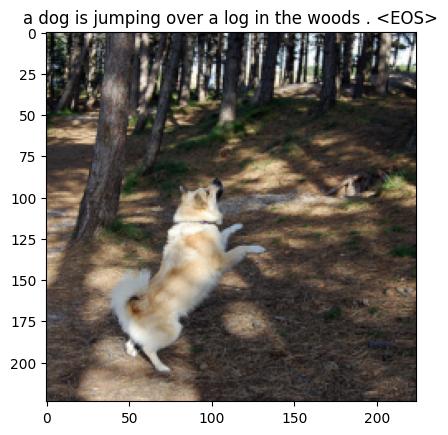

Ending epoch number: 17
Beginning epoch number: 18
Epoch: 18 Batch: 1000 loss: 2.32492
Epoch: 18 Batch: 2000 loss: 2.21107
Epoch: 18 Batch: 3000 loss: 2.24489
Epoch: 18 Batch: 4000 loss: 2.27410
Epoch: 18 Batch: 5000 loss: 2.09800
Epoch: 18 Batch: 6000 loss: 2.08113
Epoch: 18 Batch: 7000 loss: 2.66053
Epoch: 18 Batch: 8000 loss: 1.26480
Epoch: 18 Batch: 9000 loss: 2.05311
Epoch: 18 Batch: 10000 loss: 2.04590


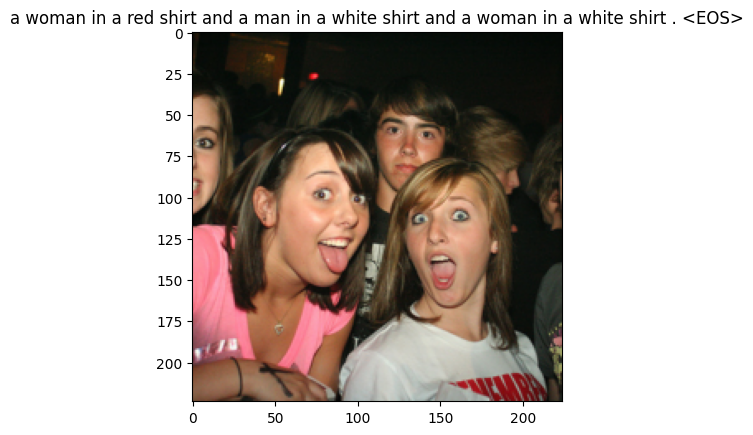

Ending epoch number: 18
Beginning epoch number: 19
Epoch: 19 Batch: 1000 loss: 2.13202
Epoch: 19 Batch: 2000 loss: 2.42101
Epoch: 19 Batch: 3000 loss: 2.28265
Epoch: 19 Batch: 4000 loss: 1.93716
Epoch: 19 Batch: 5000 loss: 2.42656
Epoch: 19 Batch: 6000 loss: 2.48091
Epoch: 19 Batch: 7000 loss: 1.84220
Epoch: 19 Batch: 8000 loss: 2.05307
Epoch: 19 Batch: 9000 loss: 2.00312
Epoch: 19 Batch: 10000 loss: 2.08004


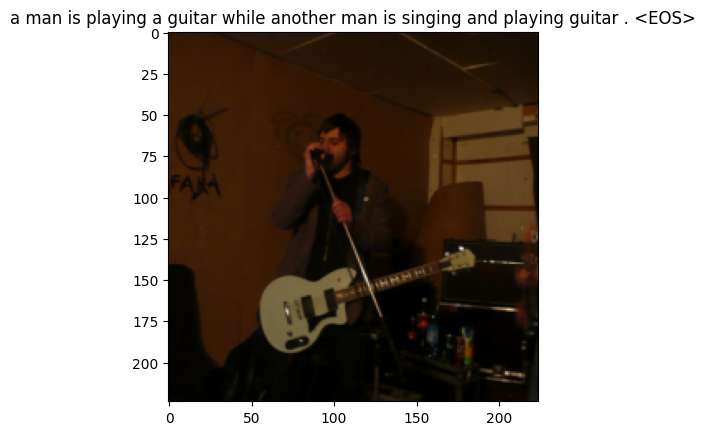

Ending epoch number: 19
Beginning epoch number: 20
Epoch: 20 Batch: 1000 loss: 1.60228
Epoch: 20 Batch: 2000 loss: 1.87868
Epoch: 20 Batch: 3000 loss: 2.54543
Epoch: 20 Batch: 4000 loss: 2.56986
Epoch: 20 Batch: 5000 loss: 2.37956
Epoch: 20 Batch: 6000 loss: 1.81113
Epoch: 20 Batch: 7000 loss: 2.02556
Epoch: 20 Batch: 8000 loss: 2.26568
Epoch: 20 Batch: 9000 loss: 2.06385
Epoch: 20 Batch: 10000 loss: 2.56077


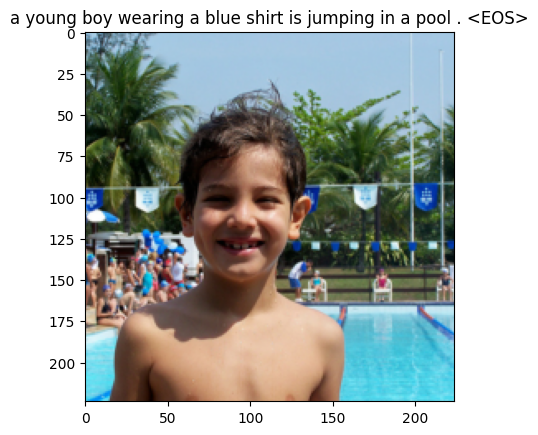

Ending epoch number: 20
Beginning epoch number: 21
Epoch: 21 Batch: 1000 loss: 2.31816
Epoch: 21 Batch: 2000 loss: 1.82383
Epoch: 21 Batch: 3000 loss: 2.29318
Epoch: 21 Batch: 4000 loss: 2.95347
Epoch: 21 Batch: 5000 loss: 2.25625
Epoch: 21 Batch: 6000 loss: 2.02476
Epoch: 21 Batch: 7000 loss: 2.13378
Epoch: 21 Batch: 8000 loss: 2.52637
Epoch: 21 Batch: 9000 loss: 2.16834
Epoch: 21 Batch: 10000 loss: 1.84988


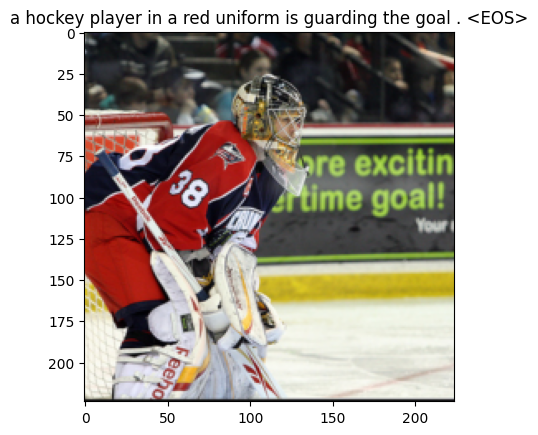

Ending epoch number: 21
Beginning epoch number: 22
Epoch: 22 Batch: 1000 loss: 1.90581
Epoch: 22 Batch: 2000 loss: 1.82848
Epoch: 22 Batch: 3000 loss: 2.21784
Epoch: 22 Batch: 4000 loss: 2.39964
Epoch: 22 Batch: 5000 loss: 1.75406
Epoch: 22 Batch: 6000 loss: 2.39253
Epoch: 22 Batch: 7000 loss: 2.34468
Epoch: 22 Batch: 8000 loss: 2.24100
Epoch: 22 Batch: 9000 loss: 1.45873
Epoch: 22 Batch: 10000 loss: 2.26251


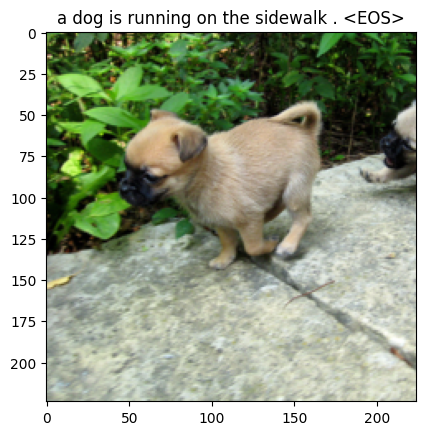

Ending epoch number: 22
Beginning epoch number: 23
Epoch: 23 Batch: 1000 loss: 1.86685
Epoch: 23 Batch: 2000 loss: 2.18551
Epoch: 23 Batch: 3000 loss: 2.99528
Epoch: 23 Batch: 4000 loss: 2.40012
Epoch: 23 Batch: 5000 loss: 2.11095
Epoch: 23 Batch: 6000 loss: 1.76319
Epoch: 23 Batch: 7000 loss: 1.81798
Epoch: 23 Batch: 8000 loss: 1.73274
Epoch: 23 Batch: 9000 loss: 1.89090
Epoch: 23 Batch: 10000 loss: 1.87162


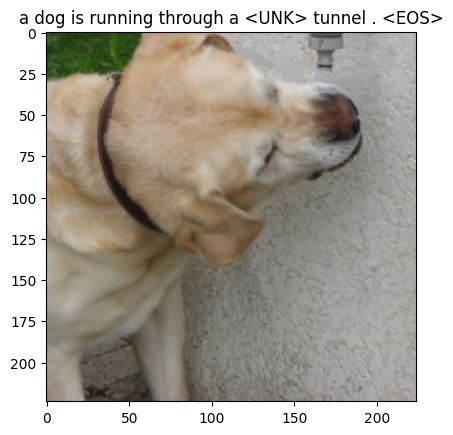

Ending epoch number: 23
Beginning epoch number: 24
Epoch: 24 Batch: 1000 loss: 1.60689
Epoch: 24 Batch: 2000 loss: 2.30468
Epoch: 24 Batch: 3000 loss: 1.82734
Epoch: 24 Batch: 4000 loss: 1.92466
Epoch: 24 Batch: 5000 loss: 1.84200
Epoch: 24 Batch: 6000 loss: 2.08350
Epoch: 24 Batch: 7000 loss: 1.89119
Epoch: 24 Batch: 8000 loss: 2.72390
Epoch: 24 Batch: 9000 loss: 2.23696
Epoch: 24 Batch: 10000 loss: 2.76507


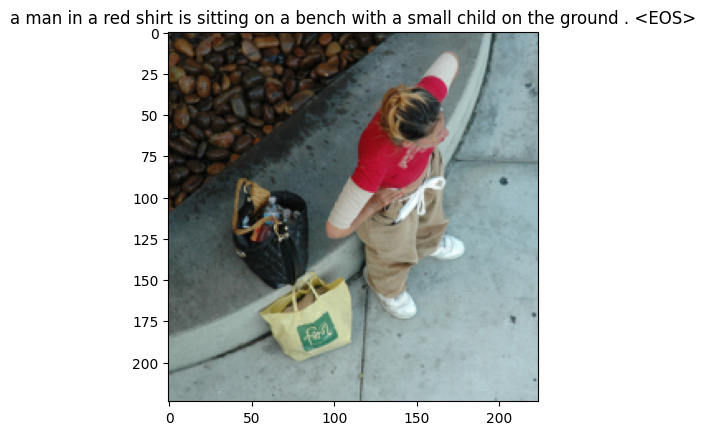

Ending epoch number: 24
Beginning epoch number: 25
Epoch: 25 Batch: 1000 loss: 1.76304
Epoch: 25 Batch: 2000 loss: 1.64459
Epoch: 25 Batch: 3000 loss: 1.84352
Epoch: 25 Batch: 4000 loss: 2.17185
Epoch: 25 Batch: 5000 loss: 2.55437
Epoch: 25 Batch: 6000 loss: 1.76305
Epoch: 25 Batch: 7000 loss: 2.12358
Epoch: 25 Batch: 8000 loss: 2.10749
Epoch: 25 Batch: 9000 loss: 2.06210
Epoch: 25 Batch: 10000 loss: 2.16338


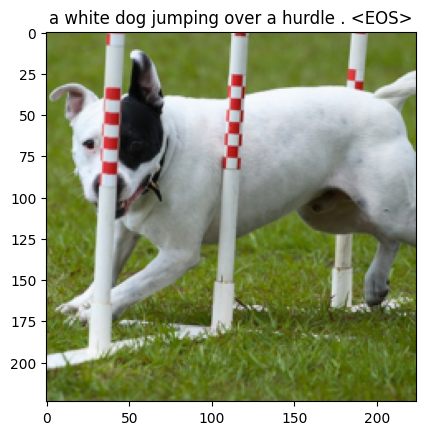

Ending epoch number: 25
Beginning epoch number: 26
Epoch: 26 Batch: 1000 loss: 1.49840
Epoch: 26 Batch: 2000 loss: 2.63000
Epoch: 26 Batch: 3000 loss: 2.05785
Epoch: 26 Batch: 4000 loss: 1.86881
Epoch: 26 Batch: 5000 loss: 2.11583
Epoch: 26 Batch: 6000 loss: 2.01735
Epoch: 26 Batch: 7000 loss: 2.06619
Epoch: 26 Batch: 8000 loss: 1.59484
Epoch: 26 Batch: 9000 loss: 2.32761
Epoch: 26 Batch: 10000 loss: 1.71537


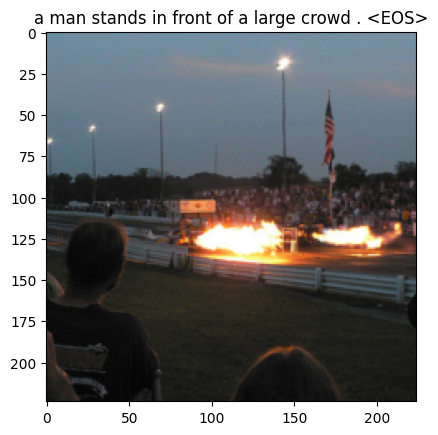

Ending epoch number: 26
Beginning epoch number: 27
Epoch: 27 Batch: 1000 loss: 1.54204
Epoch: 27 Batch: 2000 loss: 1.94731
Epoch: 27 Batch: 3000 loss: 2.21186
Epoch: 27 Batch: 4000 loss: 1.96703
Epoch: 27 Batch: 5000 loss: 2.14583
Epoch: 27 Batch: 6000 loss: 2.40032
Epoch: 27 Batch: 7000 loss: 2.42336
Epoch: 27 Batch: 8000 loss: 2.35364
Epoch: 27 Batch: 9000 loss: 1.84144
Epoch: 27 Batch: 10000 loss: 2.05153


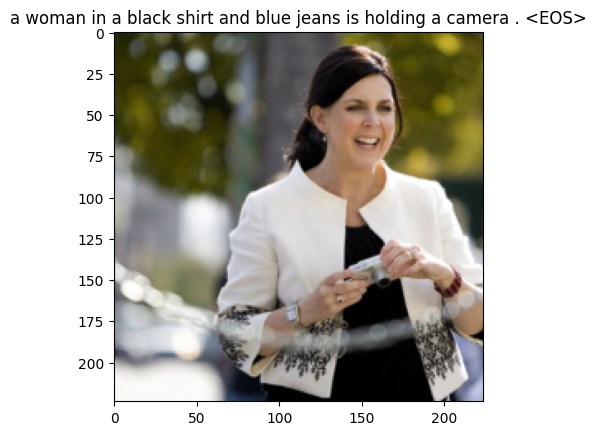

Ending epoch number: 27
Beginning epoch number: 28
Epoch: 28 Batch: 1000 loss: 1.91735
Epoch: 28 Batch: 2000 loss: 2.16072
Epoch: 28 Batch: 3000 loss: 1.84240
Epoch: 28 Batch: 4000 loss: 1.64338
Epoch: 28 Batch: 5000 loss: 2.24652
Epoch: 28 Batch: 6000 loss: 2.08097
Epoch: 28 Batch: 7000 loss: 2.44190
Epoch: 28 Batch: 8000 loss: 2.41432
Epoch: 28 Batch: 9000 loss: 1.88879
Epoch: 28 Batch: 10000 loss: 3.23114


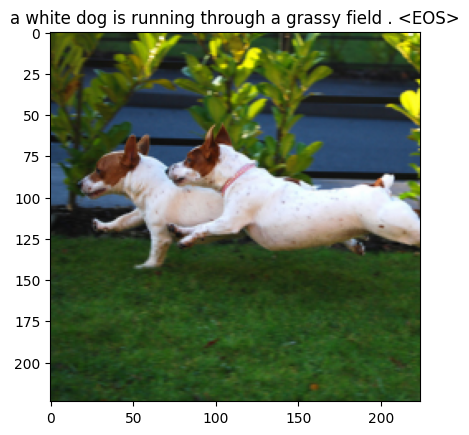

Ending epoch number: 28
Beginning epoch number: 29
Epoch: 29 Batch: 1000 loss: 1.77104
Epoch: 29 Batch: 2000 loss: 1.77282
Epoch: 29 Batch: 3000 loss: 1.52198
Epoch: 29 Batch: 4000 loss: 2.01302
Epoch: 29 Batch: 5000 loss: 2.01943
Epoch: 29 Batch: 6000 loss: 2.57299
Epoch: 29 Batch: 7000 loss: 2.26436
Epoch: 29 Batch: 8000 loss: 1.35668
Epoch: 29 Batch: 9000 loss: 2.09371
Epoch: 29 Batch: 10000 loss: 2.21952


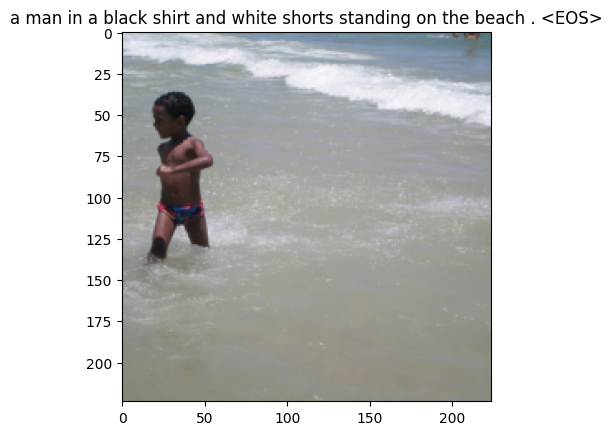

Ending epoch number: 29
Beginning epoch number: 30
Epoch: 30 Batch: 1000 loss: 1.59718
Epoch: 30 Batch: 2000 loss: 2.04057
Epoch: 30 Batch: 3000 loss: 2.53440
Epoch: 30 Batch: 4000 loss: 2.06976
Epoch: 30 Batch: 5000 loss: 2.15639
Epoch: 30 Batch: 6000 loss: 1.52741
Epoch: 30 Batch: 7000 loss: 2.11672
Epoch: 30 Batch: 8000 loss: 2.35860
Epoch: 30 Batch: 9000 loss: 2.17397
Epoch: 30 Batch: 10000 loss: 2.41595


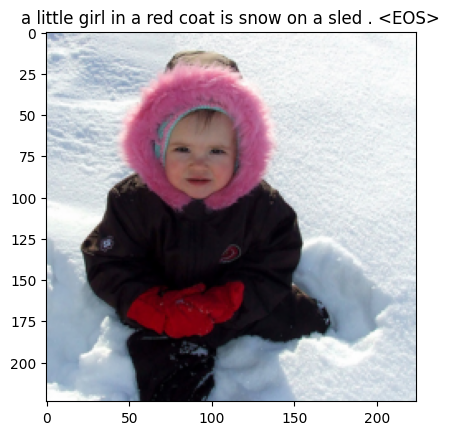

Ending epoch number: 30
Beginning epoch number: 31
Epoch: 31 Batch: 1000 loss: 1.62830
Epoch: 31 Batch: 2000 loss: 2.07070
Epoch: 31 Batch: 3000 loss: 2.05058
Epoch: 31 Batch: 4000 loss: 1.91892
Epoch: 31 Batch: 5000 loss: 2.06134
Epoch: 31 Batch: 6000 loss: 1.93117
Epoch: 31 Batch: 7000 loss: 2.19568
Epoch: 31 Batch: 8000 loss: 2.18676
Epoch: 32 Batch: 1000 loss: 1.66541
Epoch: 32 Batch: 2000 loss: 2.03431
Epoch: 32 Batch: 3000 loss: 2.07781
Epoch: 32 Batch: 4000 loss: 2.51065
Epoch: 32 Batch: 5000 loss: 2.11595
Epoch: 32 Batch: 6000 loss: 2.37870
Epoch: 32 Batch: 7000 loss: 1.67617
Epoch: 32 Batch: 8000 loss: 1.88168
Epoch: 32 Batch: 9000 loss: 2.18408
Epoch: 32 Batch: 10000 loss: 2.25866


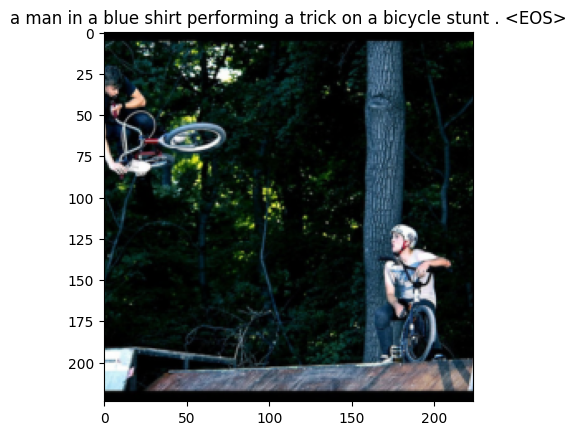

Ending epoch number: 32
Beginning epoch number: 33
Epoch: 33 Batch: 1000 loss: 2.21582
Epoch: 33 Batch: 2000 loss: 2.06383
Epoch: 33 Batch: 3000 loss: 2.36641
Epoch: 33 Batch: 4000 loss: 2.35663
Epoch: 33 Batch: 5000 loss: 2.07601
Epoch: 33 Batch: 6000 loss: 1.82875
Epoch: 33 Batch: 7000 loss: 2.11132
Epoch: 33 Batch: 8000 loss: 2.23640
Epoch: 33 Batch: 9000 loss: 2.37513
Epoch: 33 Batch: 10000 loss: 2.02208


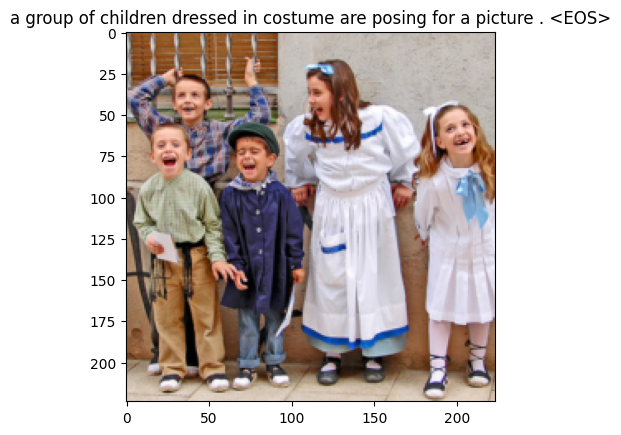

Ending epoch number: 33
Beginning epoch number: 34
Epoch: 34 Batch: 1000 loss: 1.84121
Epoch: 34 Batch: 2000 loss: 1.88375
Epoch: 34 Batch: 3000 loss: 1.44971
Epoch: 34 Batch: 4000 loss: 2.01346
Epoch: 34 Batch: 5000 loss: 2.60647
Epoch: 34 Batch: 6000 loss: 2.38577
Epoch: 34 Batch: 7000 loss: 1.69743
Epoch: 34 Batch: 8000 loss: 2.09038
Epoch: 34 Batch: 9000 loss: 1.76398
Epoch: 34 Batch: 10000 loss: 1.80747


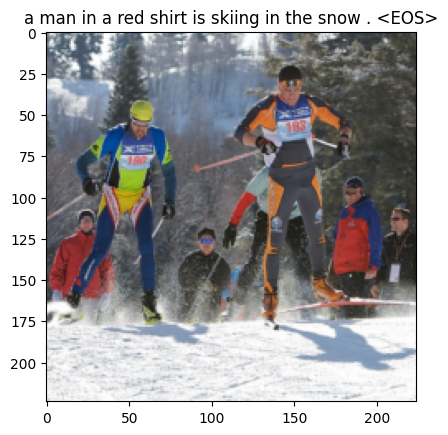

Ending epoch number: 34
Beginning epoch number: 35
Epoch: 35 Batch: 1000 loss: 1.92381
Epoch: 35 Batch: 2000 loss: 2.12286
Epoch: 35 Batch: 3000 loss: 1.94291
Epoch: 35 Batch: 4000 loss: 1.65818
Epoch: 35 Batch: 5000 loss: 1.89191
Epoch: 35 Batch: 6000 loss: 2.35576
Epoch: 35 Batch: 7000 loss: 2.10896
Epoch: 35 Batch: 8000 loss: 1.85633
Epoch: 35 Batch: 9000 loss: 1.56321
Epoch: 35 Batch: 10000 loss: 1.58008


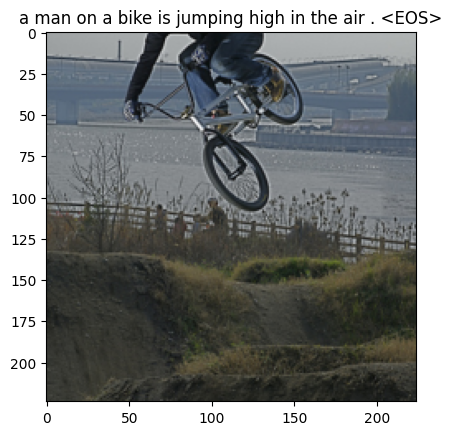

Ending epoch number: 35
Beginning epoch number: 36
Epoch: 36 Batch: 1000 loss: 2.85199
Epoch: 36 Batch: 2000 loss: 2.12487
Epoch: 36 Batch: 3000 loss: 2.01114
Epoch: 36 Batch: 4000 loss: 1.92492
Epoch: 36 Batch: 5000 loss: 2.37631
Epoch: 36 Batch: 6000 loss: 2.00764
Epoch: 36 Batch: 7000 loss: 1.77989
Epoch: 36 Batch: 8000 loss: 1.56875
Epoch: 36 Batch: 9000 loss: 1.92070
Epoch: 36 Batch: 10000 loss: 1.66722


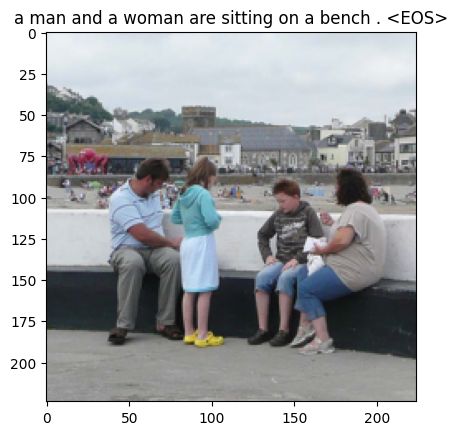

Ending epoch number: 36
Beginning epoch number: 37
Epoch: 37 Batch: 1000 loss: 1.84203
Epoch: 37 Batch: 2000 loss: 1.89222
Epoch: 37 Batch: 3000 loss: 2.33404
Epoch: 37 Batch: 4000 loss: 2.19770
Epoch: 37 Batch: 5000 loss: 2.08195
Epoch: 37 Batch: 6000 loss: 1.76852
Epoch: 37 Batch: 7000 loss: 1.58907
Epoch: 37 Batch: 8000 loss: 2.02051
Epoch: 37 Batch: 9000 loss: 1.66815
Epoch: 37 Batch: 10000 loss: 2.31291


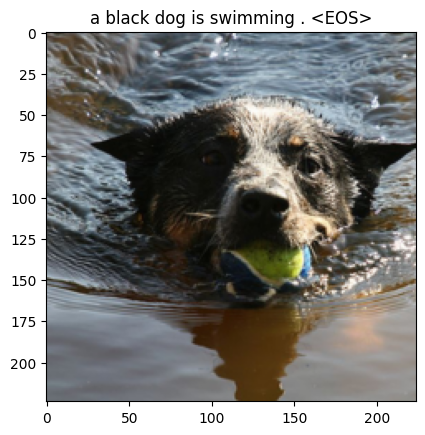

Ending epoch number: 37
Beginning epoch number: 38
Epoch: 38 Batch: 1000 loss: 1.85959
Epoch: 38 Batch: 2000 loss: 1.78862
Epoch: 38 Batch: 3000 loss: 2.25275
Epoch: 38 Batch: 4000 loss: 2.13621
Epoch: 38 Batch: 5000 loss: 1.36783
Epoch: 38 Batch: 6000 loss: 1.94750
Epoch: 38 Batch: 7000 loss: 2.34782
Epoch: 38 Batch: 8000 loss: 2.06825
Epoch: 38 Batch: 9000 loss: 1.78177
Epoch: 38 Batch: 10000 loss: 1.54407


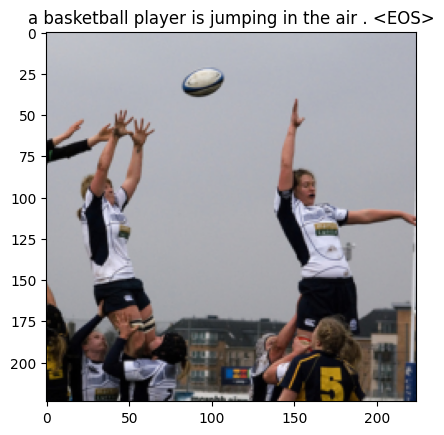

Ending epoch number: 38
Beginning epoch number: 39
Epoch: 39 Batch: 1000 loss: 2.55816
Epoch: 39 Batch: 2000 loss: 2.00127
Epoch: 39 Batch: 3000 loss: 2.12954
Epoch: 39 Batch: 4000 loss: 1.80776
Epoch: 39 Batch: 5000 loss: 1.82052
Epoch: 39 Batch: 6000 loss: 2.07354
Epoch: 39 Batch: 7000 loss: 1.77000
Epoch: 39 Batch: 8000 loss: 2.05683
Epoch: 39 Batch: 9000 loss: 1.85741
Epoch: 39 Batch: 10000 loss: 1.66147


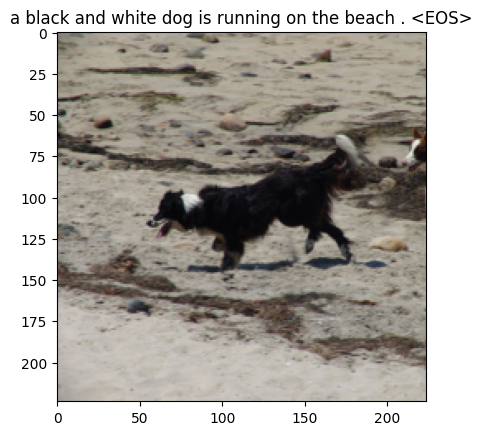

Ending epoch number: 39
Beginning epoch number: 40
Epoch: 40 Batch: 1000 loss: 1.69175
Epoch: 40 Batch: 2000 loss: 1.49915
Epoch: 40 Batch: 3000 loss: 1.63750
Epoch: 40 Batch: 4000 loss: 1.55396
Epoch: 40 Batch: 5000 loss: 1.92394
Epoch: 40 Batch: 6000 loss: 2.04188
Epoch: 40 Batch: 7000 loss: 1.96206
Epoch: 40 Batch: 8000 loss: 2.11822
Epoch: 40 Batch: 9000 loss: 1.72676
Epoch: 40 Batch: 10000 loss: 1.85511


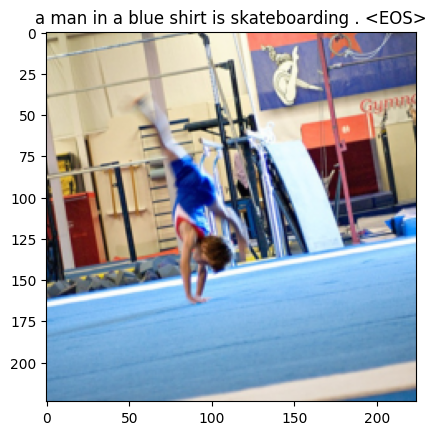

Ending epoch number: 40
Beginning epoch number: 41
Epoch: 41 Batch: 1000 loss: 2.30386
Epoch: 41 Batch: 2000 loss: 1.90448
Epoch: 41 Batch: 3000 loss: 2.00605
Epoch: 41 Batch: 4000 loss: 1.59653
Epoch: 41 Batch: 5000 loss: 1.30051
Epoch: 41 Batch: 6000 loss: 1.93837
Epoch: 41 Batch: 7000 loss: 1.68494
Epoch: 41 Batch: 8000 loss: 2.20856
Epoch: 41 Batch: 9000 loss: 1.75242
Epoch: 41 Batch: 10000 loss: 2.11783


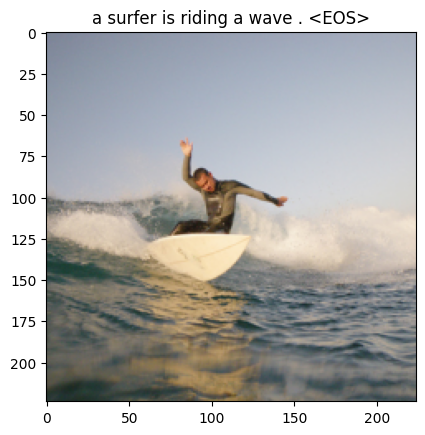

Ending epoch number: 41
Beginning epoch number: 42
Epoch: 42 Batch: 1000 loss: 1.71340
Epoch: 42 Batch: 2000 loss: 2.19505
Epoch: 42 Batch: 3000 loss: 2.02695
Epoch: 42 Batch: 4000 loss: 1.80287
Epoch: 42 Batch: 5000 loss: 2.33397
Epoch: 42 Batch: 6000 loss: 2.19366
Epoch: 42 Batch: 7000 loss: 2.08416
Epoch: 42 Batch: 8000 loss: 1.79661
Epoch: 42 Batch: 9000 loss: 2.12264
Epoch: 42 Batch: 10000 loss: 2.16765


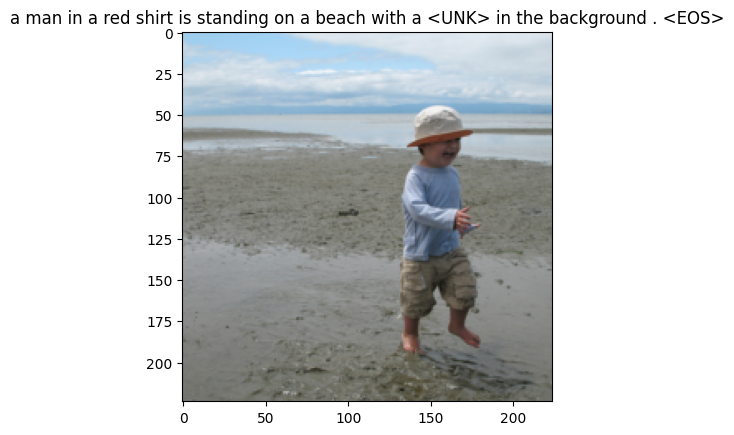

Ending epoch number: 42
Beginning epoch number: 43
Epoch: 43 Batch: 1000 loss: 2.07971
Epoch: 43 Batch: 2000 loss: 2.12907
Epoch: 43 Batch: 3000 loss: 1.47710
Epoch: 43 Batch: 4000 loss: 1.61770
Epoch: 43 Batch: 5000 loss: 1.82599
Epoch: 43 Batch: 6000 loss: 1.67259
Epoch: 43 Batch: 7000 loss: 1.57056
Epoch: 43 Batch: 8000 loss: 1.56324
Epoch: 43 Batch: 9000 loss: 1.48616
Epoch: 43 Batch: 10000 loss: 2.05374


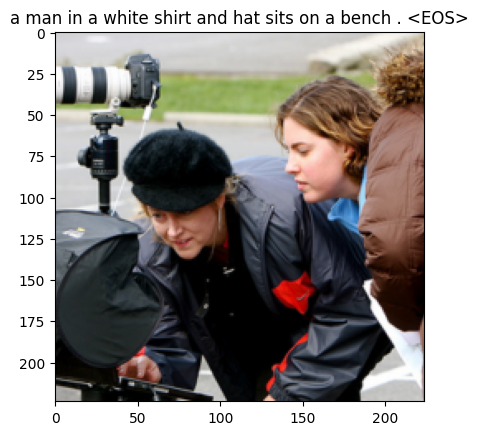

Ending epoch number: 43
Beginning epoch number: 44
Epoch: 44 Batch: 1000 loss: 2.77770
Epoch: 44 Batch: 2000 loss: 1.95471
Epoch: 44 Batch: 3000 loss: 2.00660
Epoch: 44 Batch: 4000 loss: 1.50009
Epoch: 44 Batch: 5000 loss: 1.55872
Epoch: 44 Batch: 6000 loss: 2.08382
Epoch: 44 Batch: 7000 loss: 2.36591
Epoch: 44 Batch: 8000 loss: 2.00024
Epoch: 44 Batch: 9000 loss: 1.81780
Epoch: 44 Batch: 10000 loss: 2.07271


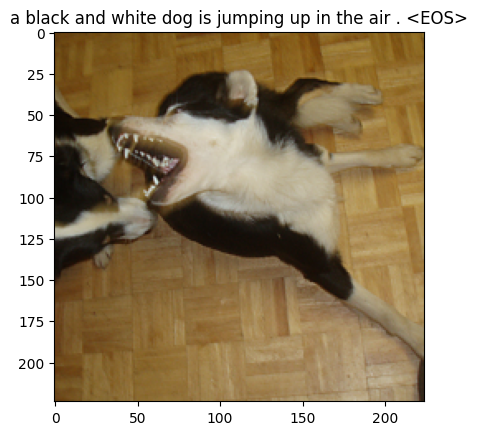

Ending epoch number: 44
Beginning epoch number: 45
Epoch: 45 Batch: 1000 loss: 1.33184
Epoch: 45 Batch: 2000 loss: 2.09162
Epoch: 45 Batch: 3000 loss: 2.10664
Epoch: 45 Batch: 4000 loss: 1.95108
Epoch: 45 Batch: 5000 loss: 1.92825
Epoch: 45 Batch: 6000 loss: 1.57554
Epoch: 45 Batch: 7000 loss: 2.58974
Epoch: 45 Batch: 8000 loss: 1.72777
Epoch: 45 Batch: 9000 loss: 1.40487
Epoch: 45 Batch: 10000 loss: 2.34666


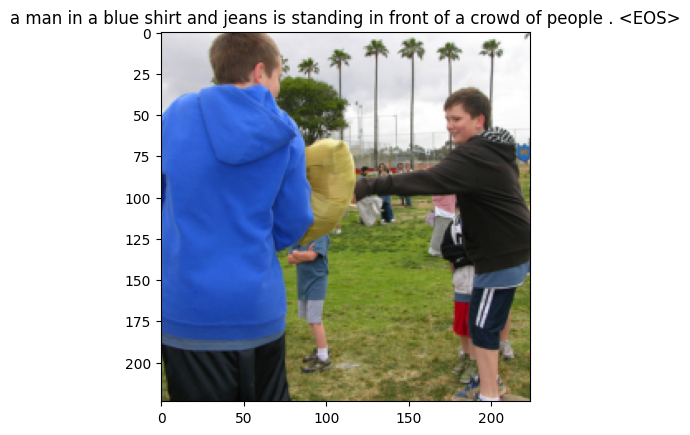

Ending epoch number: 45
Beginning epoch number: 46
Epoch: 46 Batch: 1000 loss: 1.72667
Epoch: 46 Batch: 2000 loss: 1.71613
Epoch: 46 Batch: 3000 loss: 1.84965
Epoch: 46 Batch: 4000 loss: 2.10559
Epoch: 46 Batch: 5000 loss: 1.54413
Epoch: 46 Batch: 6000 loss: 1.93089
Epoch: 46 Batch: 7000 loss: 2.00915
Epoch: 46 Batch: 8000 loss: 2.03315
Epoch: 46 Batch: 9000 loss: 2.11775
Epoch: 46 Batch: 10000 loss: 1.74073


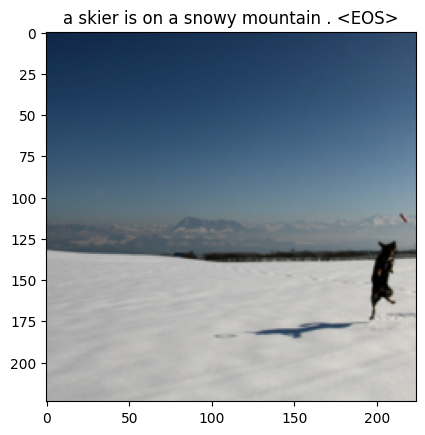

Ending epoch number: 46
Beginning epoch number: 47
Epoch: 47 Batch: 1000 loss: 1.82634
Epoch: 47 Batch: 2000 loss: 1.82149
Epoch: 47 Batch: 3000 loss: 1.73894
Epoch: 47 Batch: 4000 loss: 1.33228
Epoch: 47 Batch: 5000 loss: 1.80745
Epoch: 47 Batch: 6000 loss: 1.62481
Epoch: 47 Batch: 7000 loss: 1.92580
Epoch: 47 Batch: 8000 loss: 1.75781
Epoch: 47 Batch: 9000 loss: 1.84705
Epoch: 47 Batch: 10000 loss: 2.55773


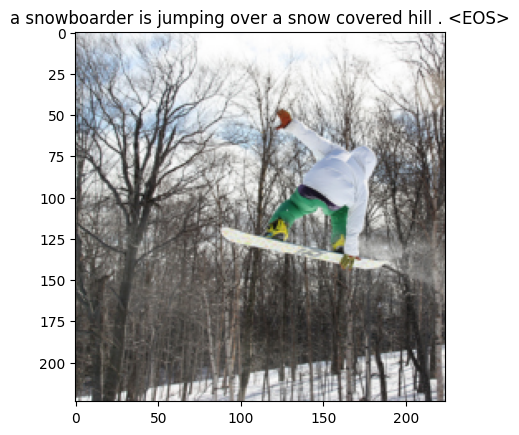

Ending epoch number: 47
Beginning epoch number: 48
Epoch: 48 Batch: 1000 loss: 1.91927
Epoch: 48 Batch: 2000 loss: 2.03165
Epoch: 48 Batch: 3000 loss: 1.56101
Epoch: 48 Batch: 4000 loss: 1.52585
Epoch: 48 Batch: 5000 loss: 2.28356
Epoch: 48 Batch: 6000 loss: 2.31228
Epoch: 48 Batch: 7000 loss: 1.47432
Epoch: 48 Batch: 8000 loss: 2.01462
Epoch: 48 Batch: 9000 loss: 1.88995
Epoch: 48 Batch: 10000 loss: 1.93931


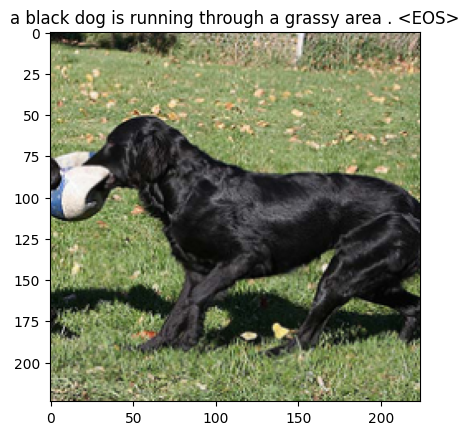

Ending epoch number: 48
Beginning epoch number: 49
Epoch: 49 Batch: 1000 loss: 2.03954
Epoch: 49 Batch: 2000 loss: 2.00423
Epoch: 49 Batch: 3000 loss: 1.73183
Epoch: 49 Batch: 4000 loss: 1.89260
Epoch: 49 Batch: 5000 loss: 2.46748
Epoch: 49 Batch: 6000 loss: 1.68890
Epoch: 49 Batch: 7000 loss: 1.43167
Epoch: 49 Batch: 8000 loss: 1.92005
Epoch: 49 Batch: 9000 loss: 1.55020
Epoch: 49 Batch: 10000 loss: 2.00790


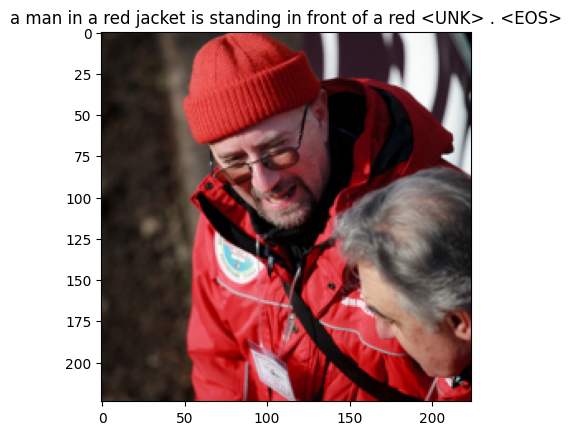

Ending epoch number: 49
Beginning epoch number: 50
Epoch: 50 Batch: 1000 loss: 1.96420
Epoch: 50 Batch: 2000 loss: 1.76541
Epoch: 50 Batch: 3000 loss: 1.70711
Epoch: 50 Batch: 4000 loss: 1.80787
Epoch: 50 Batch: 5000 loss: 1.85227
Epoch: 50 Batch: 6000 loss: 1.69517
Epoch: 50 Batch: 7000 loss: 1.84050
Epoch: 50 Batch: 8000 loss: 2.38534
Epoch: 50 Batch: 9000 loss: 2.47654
Epoch: 50 Batch: 10000 loss: 1.94404


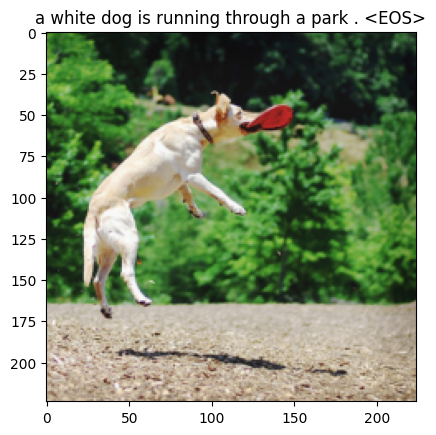

Ending epoch number: 50


In [22]:
num_epochs = 50
print_every = 1000

for epoch in range(1,num_epochs+1):
    print("Beginning epoch number:", epoch)
    for idx, (image, captions) in enumerate(iter(data_loader)):
        image,captions = image.to(device),captions.to(device)
        optimizer.zero_grad()
        outputs,attentions = model(image, captions)
        targets = captions[:,1:]
        loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))
        loss.backward()
        optimizer.step()

        if (idx+1)%print_every == 0:
            print("Epoch: {} Batch: {} loss: {:.5f}".format(epoch, idx+1, loss.item()))
        
    model.eval()
    with torch.no_grad():
        dataiter = iter(data_loader)
        img,_ = next(dataiter)
        features = model.encoder(img[0:1].to(device))
        caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
        caption = ' '.join(caps)
        show_image(img[0],title=caption)
    
    print("Ending epoch number:", epoch)

    model.train()
    save_model(model,epoch)

In [29]:
def get_caps_from(features_tensors):
    model.eval()
    with torch.no_grad():
        features = model.encoder(features_tensors.to(device))
        caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
        caption = ' '.join(caps)
        show_image(features_tensors[0],title=caption)
    
    return caps,alphas

In [30]:
def plot_attention(img, result, attention_plot):
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224 
    img[2] = img[2] * 0.225 
    img[0] += 0.485 
    img[1] += 0.456 
    img[2] += 0.406
    img = img.numpy().transpose((1, 2, 0))
    temp_image = img
    fig = plt.figure(figsize=(15, 15))
    len_result = len(result)
    for l in range(len_result):
        temp_att = attention_plot[l].reshape(7,7)
        ax = fig.add_subplot(len_result//2,len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.7, extent=img.get_extent())
    plt.tight_layout()
    plt.show()

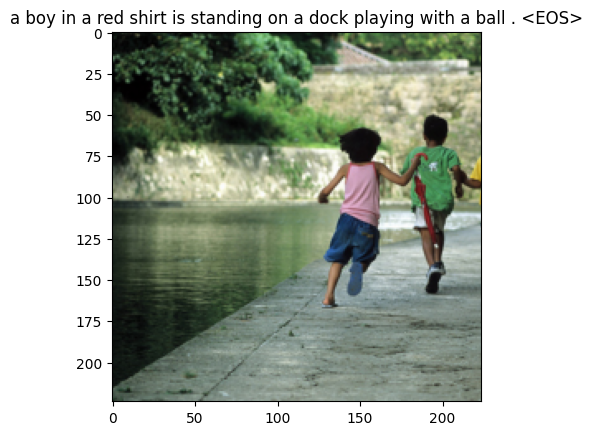

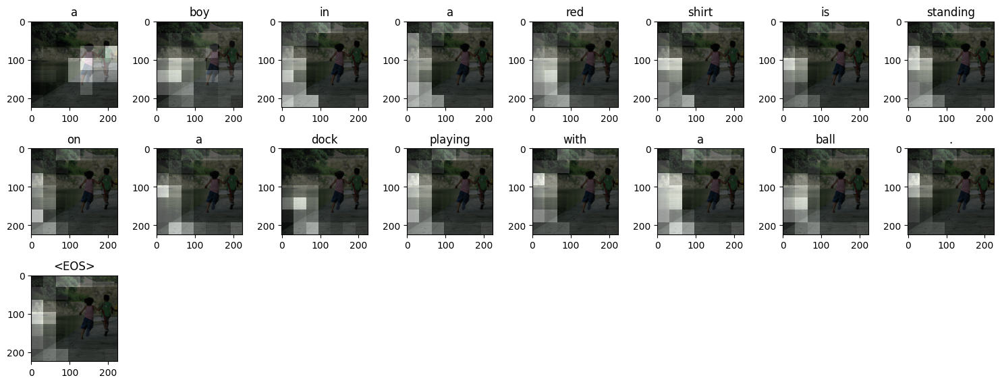

In [31]:
dataiter = iter(data_loader)
images,_ = next(dataiter)
img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))
plot_attention(img1, caps, alphas)